In [78]:
#Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.express import scatter
%matplotlib inline

In [79]:
#Setup Dataset
df = pd.read_csv('Ontario_Fuel_Prices_1990_2023.csv')

In [80]:
df.head()

,_id,Date,Ottawa,Toronto West/Ouest,Toronto East/Est,Windsor,London,Peterborough,St. Catharine's,Sudbury,...,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average/Moyenne provinciale,Southern Average/Moyenne du sud de l'Ontario,Northern Average/Moyenne du nord de l'Ontario,Fuel Type,Type de carburant
0,1,1990-01-03T00:00:00,55.9,49.1,48.7,45.2,50.1,0.0,0.0,56.4,...,56.6,55.1,58.1,0.0,0.0,50.3,49.5,56.2,Regular Unleaded Gasoline,Essence sans plomb
1,2,1990-01-10T00:00:00,55.9,47.7,46.8,49.7,47.6,0.0,0.0,56.4,...,56.8,55.0,58.2,0.0,0.0,49.2,48.3,56.2,Regular Unleaded Gasoline,Essence sans plomb
2,3,1990-01-17T00:00:00,55.9,53.2,53.2,49.6,53.7,0.0,0.0,55.8,...,56.8,54.4,58.2,0.0,0.0,53.6,53.3,56.0,Regular Unleaded Gasoline,Essence sans plomb
3,4,1990-01-24T00:00:00,55.9,53.2,53.5,49.0,52.1,0.0,0.0,55.7,...,56.8,54.3,58.2,0.0,0.0,53.5,53.2,56.0,Regular Unleaded Gasoline,Essence sans plomb
4,5,1990-01-31T00:00:00,55.9,51.9,52.6,48.6,49.1,0.0,0.0,55.6,...,56.8,54.2,58.1,0.0,0.0,52.5,52.1,55.9,Regular Unleaded Gasoline,Essence sans plomb


In [81]:
#Chechking missing values
df.isnull().sum()

_id                                              0
Date                                             0
Ottawa                                           0
Toronto West/Ouest                               0
Toronto East/Est                                 0
Windsor                                          0
London                                           0
Peterborough                                     0
St. Catharine's                                  0
Sudbury                                          0
Sault Saint Marie                                0
Thunder Bay                                      0
North Bay                                        0
Timmins                                          0
Kenora                                           0
Parry Sound                                      0
Ontario Average/Moyenne provinciale              0
Southern Average/Moyenne du sud de l'Ontario     0
Northern Average/Moyenne du nord de l'Ontario    0
Fuel Type                      

In [82]:
#Renaming Columns
renaming = {
    'Toronto West/Ouest':'Toronto West',
    'Toronto East/Est':'Toronto East',
    'Ontario Average/Moyenne provinciale':'Ontario Average',
    "Southern Average/Moyenne du sud de l'Ontario":'Southern Average',
    "Northern Average/Moyenne du nord de l'Ontario":'Northern Average'
}

df.rename(columns = renaming, inplace=True)

In [83]:
df.head()

,_id,Date,Ottawa,Toronto West,Toronto East,Windsor,London,Peterborough,St. Catharine's,Sudbury,...,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average,Southern Average,Northern Average,Fuel Type,Type de carburant
0,1,1990-01-03T00:00:00,55.9,49.1,48.7,45.2,50.1,0.0,0.0,56.4,...,56.6,55.1,58.1,0.0,0.0,50.3,49.5,56.2,Regular Unleaded Gasoline,Essence sans plomb
1,2,1990-01-10T00:00:00,55.9,47.7,46.8,49.7,47.6,0.0,0.0,56.4,...,56.8,55.0,58.2,0.0,0.0,49.2,48.3,56.2,Regular Unleaded Gasoline,Essence sans plomb
2,3,1990-01-17T00:00:00,55.9,53.2,53.2,49.6,53.7,0.0,0.0,55.8,...,56.8,54.4,58.2,0.0,0.0,53.6,53.3,56.0,Regular Unleaded Gasoline,Essence sans plomb
3,4,1990-01-24T00:00:00,55.9,53.2,53.5,49.0,52.1,0.0,0.0,55.7,...,56.8,54.3,58.2,0.0,0.0,53.5,53.2,56.0,Regular Unleaded Gasoline,Essence sans plomb
4,5,1990-01-31T00:00:00,55.9,51.9,52.6,48.6,49.1,0.0,0.0,55.6,...,56.8,54.2,58.1,0.0,0.0,52.5,52.1,55.9,Regular Unleaded Gasoline,Essence sans plomb


In [84]:
#drop last column
df = df.drop("Type de carburant", axis=1)

In [85]:
df.head()

,_id,Date,Ottawa,Toronto West,Toronto East,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average,Southern Average,Northern Average,Fuel Type
0,1,1990-01-03T00:00:00,55.9,49.1,48.7,45.2,50.1,0.0,0.0,56.4,54.8,56.6,55.1,58.1,0.0,0.0,50.3,49.5,56.2,Regular Unleaded Gasoline
1,2,1990-01-10T00:00:00,55.9,47.7,46.8,49.7,47.6,0.0,0.0,56.4,54.9,56.8,55.0,58.2,0.0,0.0,49.2,48.3,56.2,Regular Unleaded Gasoline
2,3,1990-01-17T00:00:00,55.9,53.2,53.2,49.6,53.7,0.0,0.0,55.8,54.9,56.8,54.4,58.2,0.0,0.0,53.6,53.3,56.0,Regular Unleaded Gasoline
3,4,1990-01-24T00:00:00,55.9,53.2,53.5,49.0,52.1,0.0,0.0,55.7,54.9,56.8,54.3,58.2,0.0,0.0,53.5,53.2,56.0,Regular Unleaded Gasoline
4,5,1990-01-31T00:00:00,55.9,51.9,52.6,48.6,49.1,0.0,0.0,55.6,54.8,56.8,54.2,58.1,0.0,0.0,52.5,52.1,55.9,Regular Unleaded Gasoline


## EDA

### Average fuel price for each fuel type

In [86]:
avg_price = df.groupby('Fuel Type')['Ontario Average'].mean().sort_values()

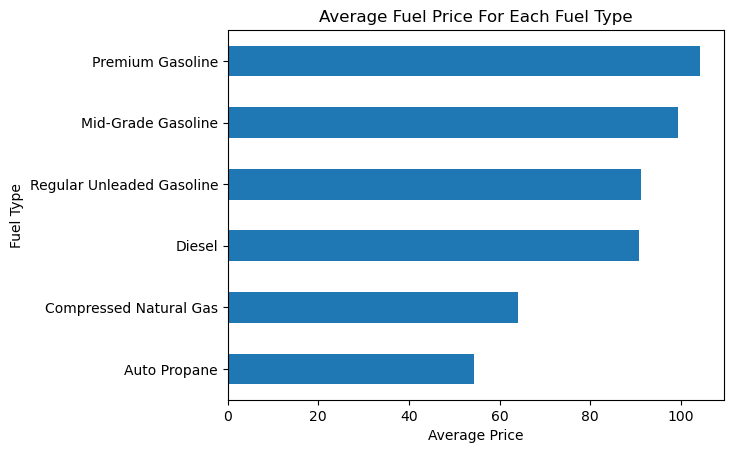

In [87]:
avg_price.plot(kind='barh')
plt.xlabel('Average Price')
plt.title('Average Fuel Price For Each Fuel Type')
plt.show()

### Different fuel prices across time

In [88]:
scatter(data_frame=df[['Date', 'Ontario Average', 'Fuel Type']].replace(0, np.nan), x='Date', y='Ontario Average', color='Fuel Type')

In [89]:
scatter(data_frame=df.replace(0, np.nan), x='Date', y=['Ontario Average'], facet_col='Fuel Type', height=900, facet_col_wrap=3)

## Each Fuel Type Analysis

In [104]:
df_byid['Fuel Type'].unique()

array(['Regular Unleaded Gasoline', 'Diesel', 'Compressed Natural Gas',
       'Mid-Grade Gasoline', 'Premium Gasoline', 'Auto Propane'],
      dtype=object)

In [105]:
df_byid = df.set_index('_id')
df_byid.head()

,Date,Ottawa,Toronto West,Toronto East,Windsor,London,Peterborough,St. Catharine's,Sudbury,Sault Saint Marie,Thunder Bay,North Bay,Timmins,Kenora,Parry Sound,Ontario Average,Southern Average,Northern Average,Fuel Type
_id,,,,,,,,,,,,,,,,,,,
1,1990-01-03T00:00:00,55.9,49.1,48.7,45.2,50.1,0.0,0.0,56.4,54.8,56.6,55.1,58.1,0.0,0.0,50.3,49.5,56.2,Regular Unleaded Gasoline
2,1990-01-10T00:00:00,55.9,47.7,46.8,49.7,47.6,0.0,0.0,56.4,54.9,56.8,55.0,58.2,0.0,0.0,49.2,48.3,56.2,Regular Unleaded Gasoline
3,1990-01-17T00:00:00,55.9,53.2,53.2,49.6,53.7,0.0,0.0,55.8,54.9,56.8,54.4,58.2,0.0,0.0,53.6,53.3,56.0,Regular Unleaded Gasoline
4,1990-01-24T00:00:00,55.9,53.2,53.5,49.0,52.1,0.0,0.0,55.7,54.9,56.8,54.3,58.2,0.0,0.0,53.5,53.2,56.0,Regular Unleaded Gasoline
5,1990-01-31T00:00:00,55.9,51.9,52.6,48.6,49.1,0.0,0.0,55.6,54.8,56.8,54.2,58.1,0.0,0.0,52.5,52.1,55.9,Regular Unleaded Gasoline


### Regular Unleaded Gasoline From Year to Year

In [106]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Regular Unleaded Gasoline'].replace(0, np.nan), x='Date', y=df.columns[1:-4])

### Diesel From Year to Year

In [107]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Diesel'].replace(0, np.nan), x='Date', y=df.columns[1:-4])

### Compressed Natural Gas From Year to Year

In [108]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Compressed Natural Gas'].replace(0, np.nan), x='Date', y=df.columns[1:-4])

### Mid-Grade Gasoline From Year to Year

In [109]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Mid-Grade Gasoline'].replace(0, np.nan), x='Date', y=df.columns[1:-4])

### Premium Gasoline From Year to Year

In [110]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Premium Gasoline'].replace(0, np.nan), x='Date', y=df.columns[1:-4])

### Auto Propane From Year to Year

In [111]:
scatter(data_frame=df_byid[df_byid['Fuel Type'] == 'Auto Propane'].replace(0, np.nan), x='Date', y=df.columns[1:-4])